In [101]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px

In [102]:
data_file = r"credit_risk_dataset.csv"
data_landing_df = pd.read_csv(data_file)

In [103]:
data_landing_df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


# Prelim Feature Selection

#### Observation: The original poster of this data trained her regression using all available features.  While there are use cases (i.e. loan loss reserve calculation, market valuation) for including risk metrics assigned at origination, namely loan_int_rate and loan_grade, I'm more interested to see how accurate we can make a loan decision engine.  As such I'll be removing loan_grade and loan_int_rate.  


In [104]:
data_landing_df = data_landing_df.drop(['loan_grade', 'loan_int_rate'], axis=1)

In [105]:
extract_df = data_landing_df.copy()

In [106]:
extract_df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_amnt,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,35000,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,1000,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,5500,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,35000,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,35000,1,0.55,Y,4


# Identify and Remove Outliers

In [107]:
def boxplot_numeric_cols(df):
    """finds and plots numeric columns in a dataframe"""
    col_list = [col for col in df.columns if np.issubdtype(df[col].dtype, np.number)]
    for col in col_list:
        fig = px.box(df[col])
        fig.show()

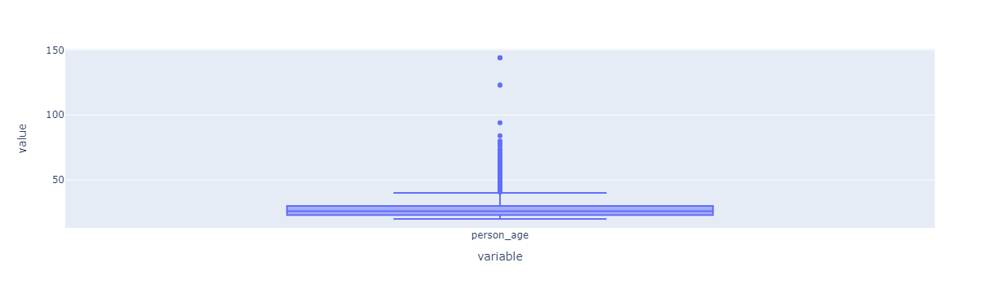

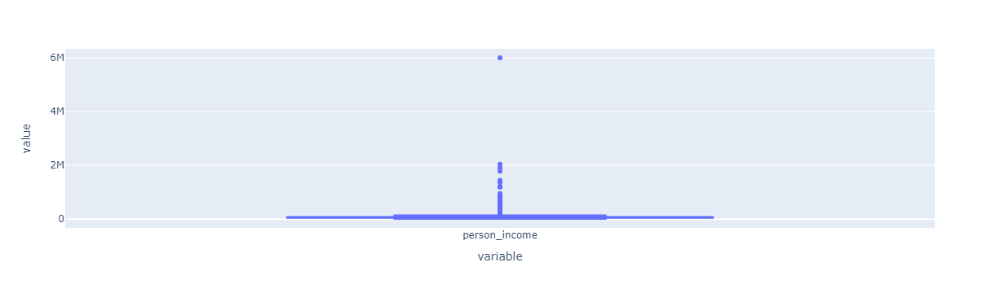

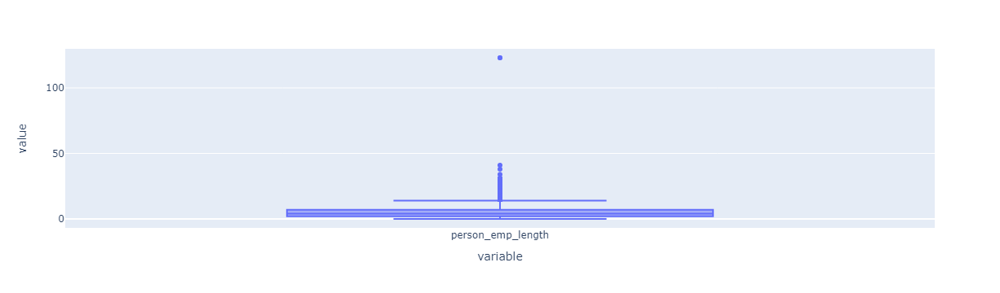

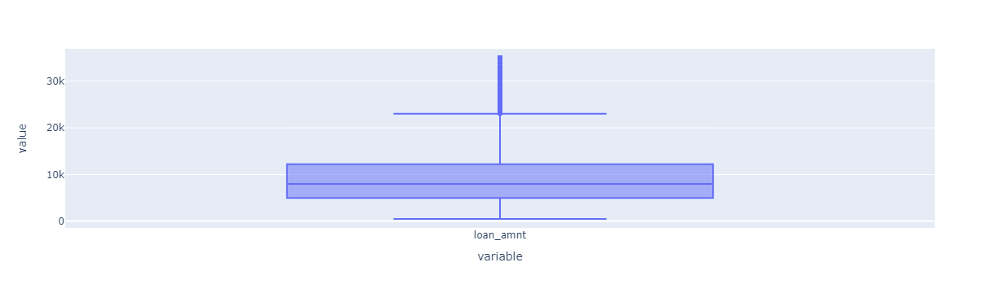

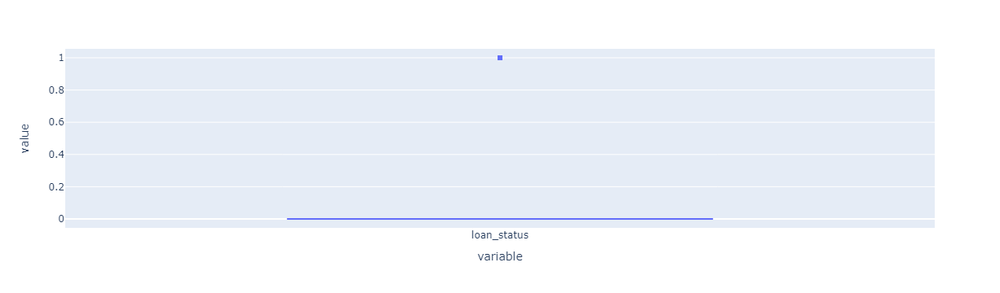

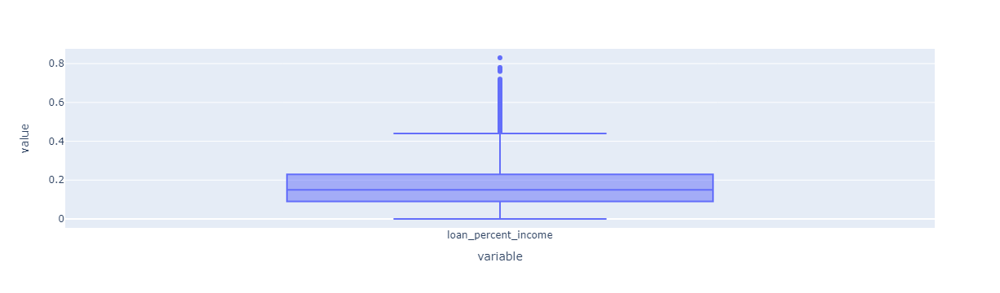

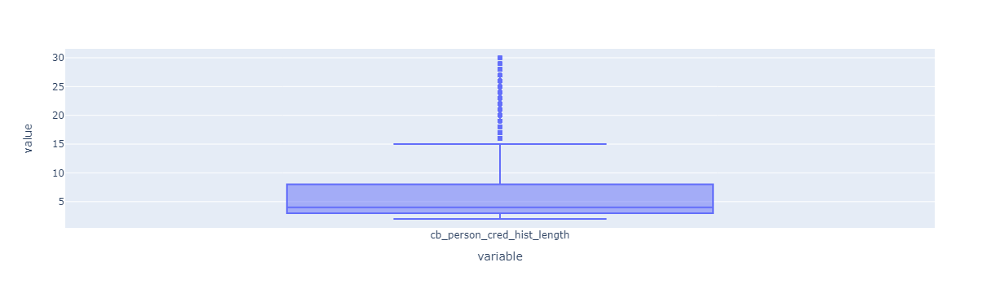

In [108]:
boxplot_numeric_cols(extract_df)

### Observations:
- Outliers
    - age - let's cap at 80
    - employment length - let's cap at 40
    - income - cap at 1M
    - rest look ok 

In [109]:
def independent_variable_capper(df, col, max_val):
    """
    Parameters:
    col : str
    max_val : int
    """
    df[col] = df[col].apply(lambda x: max_val if x > max_val else x)

In [110]:
cap_dict = {'person_age':80, 'person_emp_length':40, 'person_income':1000000}

for key,value in cap_dict.items():
    independent_variable_capper(extract_df, key, value)

In [111]:
extract_df.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,32581.000000,31686.000000,32581.000000,32581.000000,32581.000000,32581.000000
mean,27.725515,65794.814585,4.784416,9589.371106,0.218164,0.170203,5.804211
std,6.233069,49607.915005,4.044171,6322.086646,0.413006,0.106782,4.055001
min,20.000000,4000.000000,0.000000,500.000000,0.000000,0.000000,2.000000
25%,23.000000,38500.000000,2.000000,5000.000000,0.000000,0.090000,3.000000
50%,26.000000,55000.000000,4.000000,8000.000000,0.000000,0.150000,4.000000
75%,30.000000,79200.000000,7.000000,12200.000000,0.000000,0.230000,8.000000
max,80.000000,1000000.000000,40.000000,35000.000000,1.000000,0.830000,30.000000


#### max values look ok

In [112]:
extract_df.isna().sum()

person_age                      0
person_income                   0
person_home_ownership           0
person_emp_length             895
loan_intent                     0
loan_amnt                       0
loan_status                     0
loan_percent_income             0
cb_person_default_on_file       0
cb_person_cred_hist_length      0
dtype: int64

#### We're missing ~900 person_emp_length.

# Balancing

#### I experimented with imblearn's RandomOverSampler, no material difference in accuracy from manual undersampling below

In [113]:
#loan_status of 1 indicates the loan defaulted.
#'cb_person_default_on_file' will be if borrower has a previous default

In [114]:
len(extract_df[extract_df['loan_status']==1]) / len(extract_df)

0.21816396059052823

#### Observation: this is a very risky loan type if 22% of loans go bad!


In [115]:
def undersampling_balancer(df, target_col):
    
    zeros_temp_df, ones_temp_df = df[df[target_col]==0], df[df[target_col]==1]
    print(f'Count of Zeroes: {len(zeros_temp_df)}\nCount of Ones: {len(ones_temp_df)}')
    
    balanced_num = min(len(zeros_temp_df), len(ones_temp_df))
    print(f'Balancing records at {balanced_num} each')
    
    zeros_temp_df = zeros_temp_df.sample(n=balanced_num, axis=0, random_state=7)
    ones_temp_df = ones_temp_df.sample(n=balanced_num, axis=0, random_state=7)
    extract_equalized_df = pd.concat([zeros_temp_df, ones_temp_df])
    print(f'Length of df is now: {len(extract_equalized_df)}')
    return extract_equalized_df

In [116]:
extract_df = undersampling_balancer(extract_df, 'loan_status')

Count of Zeroes: 25473
Count of Ones: 7108
Balancing records at 7108 each
Length of df is now: 14216


# Train Test Split

In [117]:
from sklearn.model_selection import train_test_split

In [118]:
extract_df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_amnt,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
7892,25,46000,RENT,5.0,EDUCATION,7000,0,0.15,N,3
23454,28,30000,RENT,0.0,PERSONAL,8400,0,0.28,N,10
15310,23,60000,RENT,4.0,VENTURE,15000,0,0.25,N,3
165,24,200000,RENT,8.0,MEDICAL,12000,0,0.06,N,2
27533,28,80000,RENT,2.0,DEBTCONSOLIDATION,15000,0,0.19,N,5


In [119]:
X, y = extract_df.drop('loan_status', axis=1), extract_df['loan_status']

In [120]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

In [121]:
X_train.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_amnt,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
3780,21,38400,MORTGAGE,0.0,EDUCATION,4200,0.11,N,2
15239,22,125004,OTHER,6.0,VENTURE,10000,0.08,N,2
14254,24,90000,MORTGAGE,5.0,VENTURE,19200,0.21,Y,4
15532,24,132000,MORTGAGE,8.0,DEBTCONSOLIDATION,1500,0.01,N,2
11696,23,75000,OWN,5.0,VENTURE,7600,0.10,N,4


In [122]:
for s in X_train, y_train, X_test, y_test:
    print(s.shape)

(9951, 9)
(9951,)
(4265, 9)
(4265,)


# Create Pipelines

In [123]:
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import PowerTransformer, OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.feature_selection import SelectPercentile, chi2
from sklearn.linear_model import LogisticRegression

array([[<AxesSubplot: title={'center': 'person_age'}>,
        <AxesSubplot: title={'center': 'person_income'}>],
       [<AxesSubplot: title={'center': 'person_emp_length'}>,
        <AxesSubplot: title={'center': 'loan_amnt'}>],
       [<AxesSubplot: title={'center': 'loan_percent_income'}>,
        <AxesSubplot: title={'center': 'cb_person_cred_hist_length'}>]],
      dtype=object)

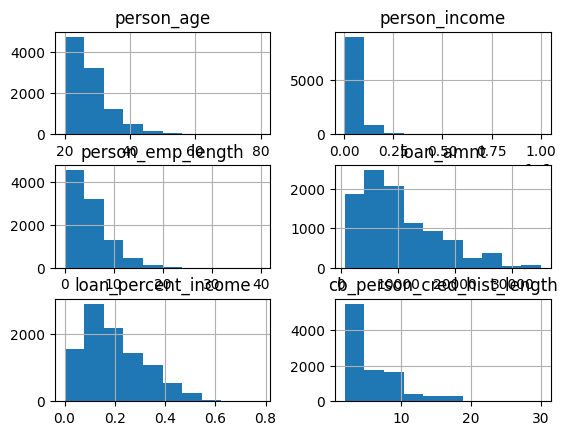

In [124]:
# let's have a look at distributions of each training col to see if we need to use PowerTransformer or can get away with StandardScalar

X_train.hist()

#### Significant skew on all numeric attributes, gonna need the big guns

In [125]:
cols_to_power = ['person_age', 'person_income', 'person_emp_length', 'loan_amnt', 'loan_percent_income', 
                 'cb_person_cred_hist_length' ]
cols_to_oh = ['person_home_ownership', 'loan_intent', 'cb_person_default_on_file']

In [126]:
#we do NOT use LabelEncoder on X cols per the documentation

#create pipelines for use on multiple columns in one step of main pipe
power_pipe = make_pipeline(PowerTransformer())
oh_pipe = make_pipeline(OneHotEncoder())

#feed appropriate column lists to each pipe
transformer = ColumnTransformer(transformers=[('log_transform', power_pipe, cols_to_power),
                                              ('oh_encode', oh_pipe, cols_to_oh)])

In [127]:
# tried variants for C and penalty args for LogReg, all still 71% accuracy in cross val
# did also try liblinear, sag, and saga solvers, barely any change to accuracy

logreg_pipe = Pipeline([
                    ('prep', transformer),
                    ('minmax', MinMaxScaler()),
                    ('imputer', IterativeImputer(max_iter=10, random_state=7)),
                    ('feat_selection', SelectPercentile(chi2, percentile=70)),
                    ('logistic_reg', LogisticRegression(solver='lbfgs', max_iter=100))])

# Fit Pipe to Training Data

In [128]:
logreg_pipe.fit(X_train, y_train)

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('log_transform',
                                                  Pipeline(steps=[('powertransformer',
                                                                   PowerTransformer())]),
                                                  ['person_age',
                                                   'person_income',
                                                   'person_emp_length',
                                                   'loan_amnt',
                                                   'loan_percent_income',
                                                   'cb_person_cred_hist_length']),
                                                 ('oh_encode',
                                                  Pipeline(steps=[('onehotencoder',
                                                                   OneHotEncoder())]),
                                                  ['person_home_ownership',
                                                   'loan_intent',
                                                   'cb_person_default_on_file'])])),
                ('minmax', MinMaxScaler()),
                ('imputer', IterativeImputer(random_state=7)),
                ('feat_selection',
                 SelectPercentile(percentile=70,
                                  score_func=<function chi2 at 0x000001E990A9DC60>)),
                ('logistic_reg', LogisticRegression())])

# Basic Scoring

In [129]:
print(logreg_pipe.score(X_train, y_train))
print(logreg_pipe.score(X_test, y_test))

0.7332931363682041
0.7376318874560375


In [130]:
y_test_pred = logreg_pipe.predict(X_test)

In [131]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

print(classification_report(y_test, y_test_pred))
print(confusion_matrix(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.74      0.74      0.74      2156
           1       0.73      0.74      0.74      2109

    accuracy                           0.74      4265
   macro avg       0.74      0.74      0.74      4265
weighted avg       0.74      0.74      0.74      4265

[[1588  568]
 [ 551 1558]]


# Cross Validation

In [132]:
from sklearn.model_selection import cross_val_score

In [133]:
scores = cross_val_score(logreg_pipe, X, y, cv=10, scoring='accuracy')
print(scores)
print(f'The mean score is {scores.mean()}')

[0.73699015 0.71237693 0.72362869 0.73839662 0.74261603 0.7257384
 0.72765658 0.74454609 0.7424349  0.7375088 ]
The mean score is 0.7331893211234735


# Test Other Models

In [134]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier

In [135]:
classifiers = [
    LogisticRegressionCV(),
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    AdaBoostClassifier(),
    HistGradientBoostingClassifier() #added in 0.21, documentation states it is much faster than GradientBoostingClassifier
    ]
for classifier in classifiers:
    classifier_test_pipe = Pipeline([('prep', transformer),
                        ('minmax', MinMaxScaler()),
                        ('imputer', IterativeImputer(max_iter=10, random_state=7)),
                        ('feat_selection', SelectPercentile(chi2, percentile=70)),
                        ('classifier', classifier)])
    classifier_test_pipe.fit(X_train, y_train)   
    print(classifier)
    scores = cross_val_score(classifier_test_pipe, X, y, cv=10, scoring='accuracy')
    print(f'The mean score is {scores.mean()}')

LogisticRegressionCV()
The mean score is 0.733752156471493
KNeighborsClassifier()
The mean score is 0.7388877506480549
DecisionTreeClassifier()
The mean score is 0.738464621990219
RandomForestClassifier()
The mean score is 0.7672343024216817
AdaBoostClassifier()
The mean score is 0.7573168100355231
HistGradientBoostingClassifier()
The mean score is 0.8002239860006275


# Iterate Through KNN

In [136]:
neighbors = list(np.arange(2,40,2))
mean_scores_list = []

for neighbor in neighbors:
    knn_test_pipe = Pipeline([('prep', transformer),
                        ('minmax', MinMaxScaler()),
                        ('imputer', IterativeImputer(max_iter=10, random_state=7)),
                        ('classifier', KNeighborsClassifier(neighbor))])
    knn_test_pipe.fit(X_train, y_train) 
    scores = cross_val_score(knn_test_pipe, X, y, cv=10, scoring='accuracy')
    mean_scores_list.append(scores.mean())

<AxesSubplot: >

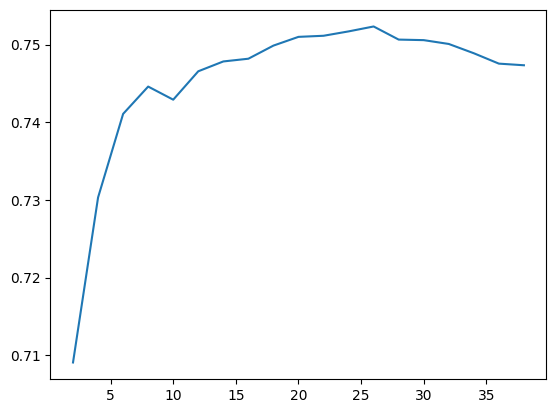

In [137]:
#graph mean cross_val scores by # of neighbors

sns.lineplot(x=neighbors, y=mean_scores_list)

#### Observation: 36 neighbors is the highest in our test, but still not as good as gradient boosting, so moving on..

# Grid Search

#### Since our HistGradientBoostingClassifier did the best so far, let's proceed with grid search

In [138]:
from sklearn.model_selection import GridSearchCV

In [139]:
hgbc_test_pipe = Pipeline([('prep', transformer),
                    ('minmax', MinMaxScaler()),
                    ('imputer', IterativeImputer(max_iter=10, random_state=7)),
                    ('feat_selection', SelectPercentile()),
                    ('classifier', HistGradientBoostingClassifier())])

In [141]:
%%time
parameters = {
    'feat_selection__percentile': list(np.arange(10,110,10)),
    'classifier__learning_rate': [0.01, 0.025, 0.05, 0.075, 0.1, 0.15, 0.2],
    'classifier__max_leaf_nodes': [10,20,50],
    'classifier__min_samples_leaf': [10,20,50]
    }

CV = GridSearchCV(hgbc_test_pipe, parameters, cv=3, n_jobs= -1)
CV.fit(X_train, y_train)

print(CV.best_params_)    
print(CV.best_score_)


{'classifier__learning_rate': 0.15, 'classifier__max_leaf_nodes': 20, 'classifier__min_samples_leaf': 50, 'feat_selection__percentile': 90}
0.8061501356647574
CPU times: total: 24.2 s
Wall time: 16min 53s


In [142]:
# We are > 80% accuracy.  Hooray.

# Feed best params back into final model

In [143]:
import re

feat_param_dict = {}
class_param_dict = {}

for key, value in CV.best_params_.items():
    if re.search('feat_selection__.*', key):
        key = key.replace('feat_selection__', '')
        feat_param_dict[key]=value
    else:
        key = key.replace('classifier__', '')
        class_param_dict[key]=value
    

In [144]:
class_param_dict

{'learning_rate': 0.15, 'max_leaf_nodes': 20, 'min_samples_leaf': 50}

In [145]:
hgbc_final_pipe = Pipeline([('prep', transformer),
                    ('minmax', MinMaxScaler()),
                    ('imputer', IterativeImputer(max_iter=10, random_state=7)),
                    ('feat_selection', SelectPercentile(**feat_param_dict)),
                    ('classifier', HistGradientBoostingClassifier(**class_param_dict))])

In [146]:
hgbc_final_pipe.fit(X_train, y_train)

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('log_transform',
                                                  Pipeline(steps=[('powertransformer',
                                                                   PowerTransformer())]),
                                                  ['person_age',
                                                   'person_income',
                                                   'person_emp_length',
                                                   'loan_amnt',
                                                   'loan_percent_income',
                                                   'cb_person_cred_hist_length']),
                                                 ('oh_encode',
                                                  Pipeline(steps=[('onehotencoder',
                                                                   OneHotEncoder())]),
                                                  ['person_home_ownership',
                                                   'loan_intent',
                                                   'cb_person_default_on_file'])])),
                ('minmax', MinMaxScaler()),
                ('imputer', IterativeImputer(random_state=7)),
                ('feat_selection', SelectPercentile(percentile=90)),
                ('classifier',
                 HistGradientBoostingClassifier(learning_rate=0.15,
                                                max_leaf_nodes=20,
                                                min_samples_leaf=50))])

In [147]:
hgbc_final_pipe.score(X_test, y_test)

0.8086752637749121

In [148]:
hgbc_y_test_pred = hgbc_final_pipe.predict(X_test)

In [150]:
print(classification_report(y_test, hgbc_y_test_pred))

              precision    recall  f1-score   support

           0       0.78      0.86      0.82      2156
           1       0.84      0.75      0.80      2109

    accuracy                           0.81      4265
   macro avg       0.81      0.81      0.81      4265
weighted avg       0.81      0.81      0.81      4265



#### Final Thoughts:

- We only got this model to 80% accuracy, but I find this reasonable given our limited loan attributes.  Ideally we'd also have:
    - credit score, probably the best single underwriting input.  they have sophisticated models to produce FICOs, which surely would help ours here.
    - alternative credit sources (utility, insurance, phone bills, etc.)
    - if this was a banking client we could use deposit history as well, a more recent way to assess risk.

- Removing interest rate and loan grade did cost us significantly in accuracy vs OP, who was able to get .92 accuracy in the end.  In addition, OP did not use cross-validation and incorrectly used LabelEncoder on X values.

- Thinking about actually lending, better to be conservative, so might use this to auto-approve a lower % of applications, call it 80%, and the rest can go to a human underwriter.

- And of course this model is trying to predict probability of default at origination.  A lender is in the business of taking moderate risk, so this would just be a jumping off point for the credit risk team to set final guidelines.